In [1]:
import pandas as pd 
import numpy as np 
from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LinearRegression
from sklearn.model_selection import train_test_split
import statsmodels.api as sm 
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [2]:
from pandas_profiling import ProfileReport

In [3]:
data =pd.read_csv('Admission_Prediction.csv')
data.head()

,Serial No.,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,1,337.0,118.0,4.0,4.5,4.5,9.65,1,0.92
1,2,324.0,107.0,4.0,4.0,4.5,8.87,1,0.76
2,3,NaN,104.0,3.0,3.0,3.5,8.00,1,0.72
3,4,322.0,110.0,3.0,3.5,2.5,8.67,1,0.80
4,5,314.0,103.0,2.0,2.0,3.0,8.21,0,0.65


In [4]:
pr = ProfileReport(data)

In [5]:
pr

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Preprocessing The Data

In [13]:
data['GRE Score'].isnull().sum()

15

In [14]:
data['TOEFL Score'].isnull().sum()

10

In [15]:
data['University Rating'].isnull().sum()

15

In [16]:
data['SOP'].isnull().sum()

0

In [17]:
data['LOR'].isnull().sum()

0

In [18]:
data['CGPA'].isnull().sum()

0

In [19]:
data['Research'].isnull().sum()

0

In [20]:
data['Chance of Admit'].isnull().sum()

0

# Filling missing values

In [22]:
data['GRE Score']=data['GRE Score'].fillna(data['GRE Score'].mean())

In [33]:
data['TOEFL Score'].isnull().sum()

0

In [23]:
data['TOEFL Score']=data['TOEFL Score'].fillna(data['TOEFL Score'].mean())

In [32]:
data['TOEFL Score'].isnull().sum()

0

In [28]:
data['University Rating']=data['University Rating'].fillna(data['University Rating'].mode()[0])

In [31]:
data['University Rating'].isnull().sum()

0

# Removing Serial No Column

In [35]:
data = data.drop(columns=['Serial No.'])

In [36]:
data.head()

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research,Chance of Admit
0,337.000000,118.0,4.0,4.5,4.5,9.65,1,0.92
1,324.000000,107.0,4.0,4.0,4.5,8.87,1,0.76
2,316.558763,104.0,3.0,3.0,3.5,8.00,1,0.72
3,322.000000,110.0,3.0,3.5,2.5,8.67,1,0.80
4,314.000000,103.0,2.0,2.0,3.0,8.21,0,0.65


# Checking the Distribution of each Column

C:\Users\91979\anaconda3\envs\ineu\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\91979\anaconda3\envs\ineu\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\91979\anaconda3\envs\ineu\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibili

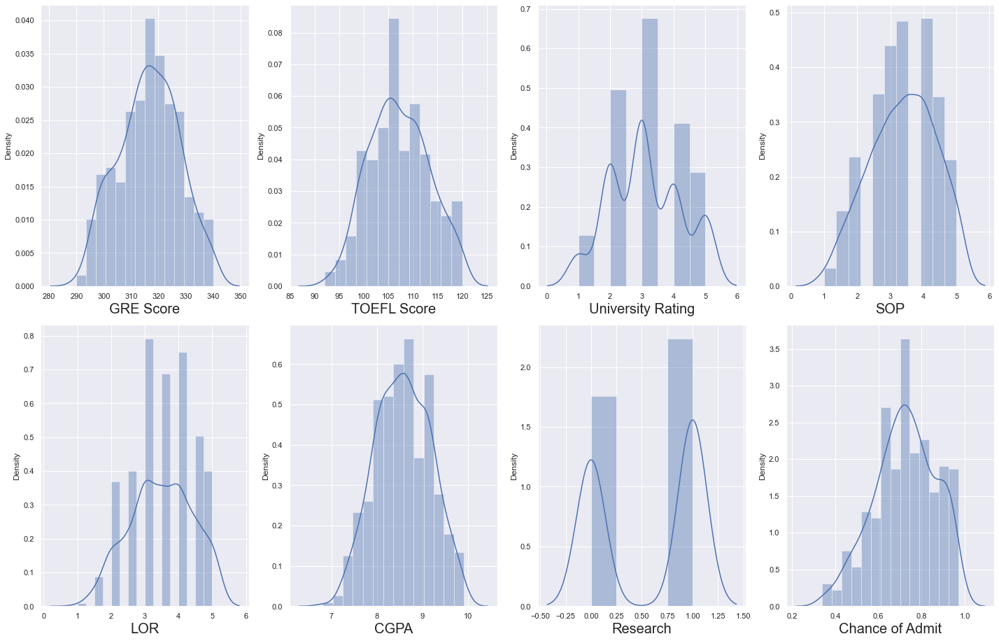

In [37]:
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in data:
    if plotnumber<=16 :
        ax = plt.subplot(4,4,plotnumber)
        sns.distplot(data[column])
        plt.xlabel(column,fontsize=20)
        #plt.ylabel('Salary',fontsize=20)
    plotnumber+=1
plt.tight_layout()

# Spliting into X and Y 

In [44]:
X = data.drop(columns=['Chance of Admit'])
y = data['Chance of Admit']

# Creating Scattered plot

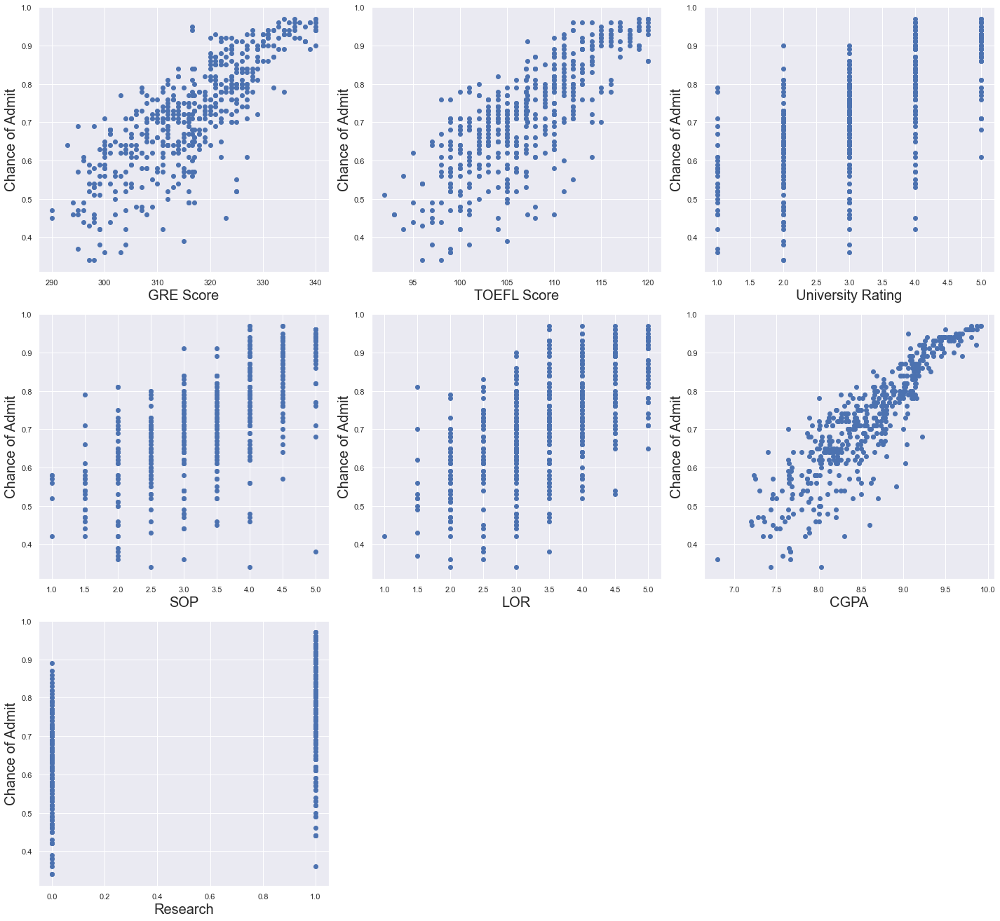

In [47]:
plt.figure(figsize=(20,30), facecolor='white')
plotnumber = 1

for column in X:
    if plotnumber<=15 :
        ax = plt.subplot(5,3,plotnumber)
        plt.scatter(X[column],y)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Chance of Admit',fontsize=20)
    plotnumber+=1
plt.tight_layout()

# Scaling data

In [48]:
scaler = StandardScaler()

In [54]:
x_scaler = scaler.fit_transform(X)

In [56]:
x_scaler

array([[ 1.84274116e+00,  1.78854223e+00,  7.82009548e-01, ...,
         1.09894429e+00,  1.77680627e+00,  8.86405260e-01],
       [ 6.70814288e-01, -3.10581135e-02,  7.82009548e-01, ...,
         1.09894429e+00,  4.85859428e-01,  8.86405260e-01],
       [ 5.12433309e-15, -5.27312752e-01, -1.04622593e-01, ...,
         1.73062093e-02, -9.54042814e-01,  8.86405260e-01],
       ...,
       [ 1.21170361e+00,  2.11937866e+00,  1.66864169e+00, ...,
         1.63976333e+00,  1.62785086e+00,  8.86405260e-01],
       [-4.10964364e-01, -6.92730965e-01,  7.82009548e-01, ...,
         1.63976333e+00, -2.42366993e-01, -1.12815215e+00],
       [ 9.41258951e-01,  9.61451165e-01,  7.82009548e-01, ...,
         1.09894429e+00,  7.67219636e-01, -1.12815215e+00]])

In [59]:
data.columns

Index(['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR', 'CGPA',
       'Research', 'Chance of Admit'],
      dtype='object')

In [61]:
df = pd.DataFrame(x_scaler,columns=['GRE Score', 'TOEFL Score', 'University Rating', 'SOP', 'LOR', 'CGPA',
       'Research'])

In [62]:
df.head()

,GRE Score,TOEFL Score,University Rating,SOP,LOR,CGPA,Research
0,1.842741e+00,1.788542,0.782010,1.137360,1.098944,1.776806,0.886405
1,6.708143e-01,-0.031058,0.782010,0.632315,1.098944,0.485859,0.886405
2,5.124333e-15,-0.527313,-0.104623,-0.377773,0.017306,-0.954043,0.886405
3,4.905178e-01,0.465197,-0.104623,0.127271,-1.064332,0.154847,0.886405
4,-2.306679e-01,-0.692731,-0.991255,-1.387862,-0.523513,-0.606480,-1.128152


C:\Users\91979\anaconda3\envs\ineu\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\91979\anaconda3\envs\ineu\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\91979\anaconda3\envs\ineu\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibili

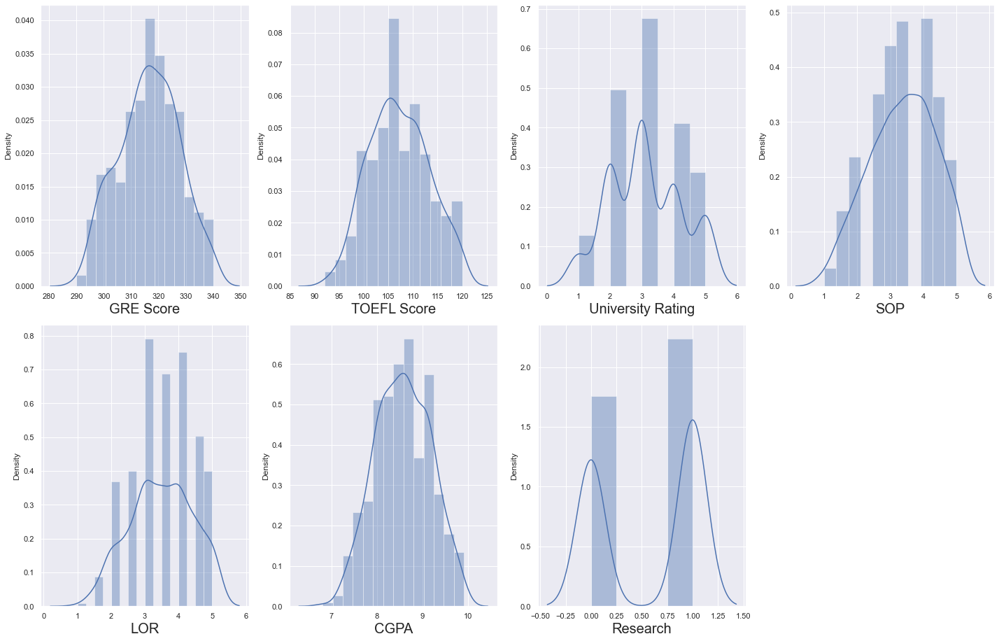

In [63]:
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in df:
    if plotnumber<=16 :
        ax = plt.subplot(4,4,plotnumber)
        sns.distplot(data[column])
        plt.xlabel(column,fontsize=20)
        #plt.ylabel('Salary',fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [64]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Handling MultiColinearity using vif score

In [65]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [66]:
variables = x_scaler

In [67]:
vif_df = pd.DataFrame()

In [70]:
vif_df

""


In [72]:
variables.shape

(500, 7)

In [75]:
for i in range(variables.shape[1]):
    print(i)

0
1
2
3
4
5
6


In [77]:
vif_df["VIF"] = [variance_inflation_factor(variables, i) for i in range(variables.shape[1])]

In [78]:
vif_df

,VIF
0,4.152735
1,3.793345
2,2.517272
3,2.776393
4,2.037449
5,4.654369
6,1.459411


In [79]:
variance_inflation_factor(variables, 0)

4.152734526510756

In [80]:
vif_df["features"] = X.columns

In [81]:
vif_df

,VIF,features
0,4.152735,GRE Score
1,3.793345,TOEFL Score
2,2.517272,University Rating
3,2.776393,SOP
4,2.037449,LOR
5,4.654369,CGPA
6,1.459411,Research


# Spliting Data into train and test 

In [83]:
x_train,x_test,y_train,y_test = train_test_split(x_scaler,y,test_size = 0.25,random_state=355)

In [86]:
regression = LinearRegression()

regression.fit(x_train,y_train)

LinearRegression()

# Saving Model

In [88]:
import pickle

In [89]:
filename = 'linear_model.pickle'
pickle.dump(regression, open(filename, 'wb'))

# prediction using the saved model

In [90]:
loaded_model = pickle.load(open(filename, 'rb'))
a=loaded_model.predict(scaler.transform([[300,110,5,5,5,10,1]]))
a

C:\Users\91979\anaconda3\envs\ineu\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


array([0.92190162])

# R Square

In [91]:
regression.score(x_train,y_train)

0.8415250484247909

# Adjusted R Square


In [92]:
# Let's create a function to create adjusted R-Squared
def adj_r2(x,y):
    r2 = regression.score(x,y)
    n = x.shape[0]
    p = x.shape[1]
    adjusted_r2 = 1-(1-r2)*(n-1)/(n-p-1)
    return adjusted_r2

In [93]:
adj_r2(x_train,y_train)

0.8385023654247188

# Since R square and R are nearly same which implies that we are not being penalized for adding any feature.

# Now for test data

In [94]:
regression.score(x_test,y_test)

0.7534898831471064

In [96]:
adj_r2(x_test,y_test)

0.738741414617446

# our model r2 score is less on the test data. This means model is overfitting